In [1]:
import sys
sys.path.insert(0, "D:/00ScienceStudy/Biology/Spateo/spateo-release")
import spateo as st
import pyvista as pv
import seaborn as sns
import anndata as ad
import numpy as np

In [2]:
adata = ad.read_h5ad('Human_embryo_aligned.h5ad')
adata

AnnData object with n_obs × n_vars = 38562 × 1
    obs: 'subcluster_value', 'subcluster', 'slice_id'
    obsm: 'aligned_spatial', 'aligned_spatial_3D', 'spatial', 'spatial_3d'

In [3]:
adata.obsm['PASTE_aligned_spatial_3D'] = np.concatenate([adata.obsm['spatial_3d'][:,1:], adata.obsm['spatial_3d'][:,0:1]], axis=1)

In [4]:
labels_list = adata.obs.subcluster.cat.categories

In [5]:
import pandas as pd
colormap = pd.read_csv('subclusters-colors.tsv', sep='\t', header=None)

In [6]:
palette = {}
for k, v in zip(colormap[0].values, colormap[1].values):
    palette[k] = v

In [7]:
aligned_pc, _ = st.tdr.construct_pc(adata=adata,spatial_key='aligned_spatial_3D',groupby='subcluster',key_added='celltype', colormap=palette)

In [8]:
aligned_pc_rot = aligned_pc.rotate_z(30+180)
aligned_pc_rot = aligned_pc_rot.rotate_y(180)
adata.obsm['aligned_spatial_3D'] = aligned_pc_rot.points

In [9]:
aligned_pc, _ = st.tdr.construct_pc(adata=adata,spatial_key='aligned_spatial_3D',groupby='subcluster',key_added='celltype', colormap=palette)

In [10]:
paste_aligned_pc, _ = st.tdr.construct_pc(adata=adata,spatial_key='PASTE_aligned_spatial_3D',groupby='subcluster',key_added='celltype', colormap=palette)

In [11]:
paste_aligned_pc_rot = paste_aligned_pc.rotate_z(20+180)
paste_aligned_pc_rot = paste_aligned_pc_rot.rotate_y(180)
adata.obsm['PASTE_aligned_spatial_3D'] = paste_aligned_pc_rot.points

In [12]:
paste_aligned_pc, _ = st.tdr.construct_pc(adata=adata,spatial_key='PASTE_aligned_spatial_3D',groupby='subcluster',key_added='celltype', colormap=palette)

In [34]:
_ = st.pl.three_d_multi_plot(
    model=st.tdr.collect_models([aligned_pc, paste_aligned_pc]),
    key="celltype",
    model_style="points",
    jupyter=False,
    cpo='xy',
    model_size=8,
    window_size=(800,800),
    opacity=1,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



In [14]:
labels_list

Index(['AM', 'AM.EXE.Meso', 'AM.Ecto', 'Axial.Meso', 'Connecting Stalk',
       'Definitive.Endo', 'Definitive.HSPC', 'EXE.Meso.Prog', 'Ecto', 'Epi',
       'Ery-1', 'Ery-2', 'Fibroblast', 'Gast/PS', 'HEC', 'Inter.Meso',
       'LP.Meso', 'MEP', 'Muscle fiber', 'Nascent.EXE.Meso', 'Noto',
       'Para.Meso', 'Primitive.HPSC', 'Primitive.Mac', 'Primitive.Mega-1',
       'Primitive.Mega-2', 'Visceral.Endo', 'YS.EXE.Meso-1', 'YS.EXE.Meso-2',
       'YS.Endo-1', 'YS.Endo-2', 'YS.Endo-3', 'YS.Endo-4', 'YS.Mesothelium'],
      dtype='object')

## determine the first box in paste view

In [21]:
## clip paste
paste_aligned_pc_clip = paste_aligned_pc.copy()

In [29]:
paste_aligned_pc_clip = st.tdr.interactive_rectangle_clip(model=paste_aligned_pc_clip, key='celltype', invert=True)[0]

In [26]:
paste_aligned_pc_clip.save('paste_clip_view2_new.vtk')

In [30]:
bound_max = paste_aligned_pc_clip.points.max(0)
bound_min = paste_aligned_pc_clip.points.min(0)
# Define the box corners based on the bounds
corners = np.array([[bound_min[0], bound_min[1], bound_min[2]],
                    [bound_max[0], bound_min[1], bound_min[2]],
                    [bound_max[0], bound_max[1], bound_min[2]],
                    [bound_min[0], bound_max[1], bound_min[2]],
                    [bound_min[0], bound_min[1], bound_max[2]],
                    [bound_max[0], bound_min[1], bound_max[2]],
                    [bound_max[0], bound_max[1], bound_max[2]],
                    [bound_min[0], bound_max[1], bound_max[2]]])

# Create a PolyData object for the corners
box = pv.PolyData(corners)

# Define the edges of the box
edges = np.array([[0, 1], [1, 2], [2, 3], [3, 0],  # Bottom face
                  [4, 5], [5, 6], [6, 7], [7, 4],  # Top face
                  [0, 4], [1, 5], [2, 6], [3, 7]]) # Vertical edges

# Add the edges to the PolyData object
box.lines = np.hstack((np.ones((12, 1)) * 2, edges)).astype(np.int32)

import matplotlib as mpl
labels = ["embryo_shell"]*box.n_cells
box.cell_data["celltype"] = labels
c = [1,1,1]
a = 1
labels_rgba = [mpl.colors.to_rgba(c, alpha=a)] * box.n_cells
labels_rgba = np.array(labels_rgba).astype(np.float32)
box.cell_data["celltype_rgba"] = labels_rgba

In [47]:
cpo1, _ = st.pl.three_d_plot(
    model=st.tdr.collect_models([box, paste_aligned_pc]), 
    key="celltype", 
    model_style=["wireframe", "points"], 
    model_size=[2, 4],
    colormap=None,
    show_legend=True,
    show_axes=True,
    jupyter=False,
    cpo="xz",
    window_size=(800, 800),
    ambient=0.2,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



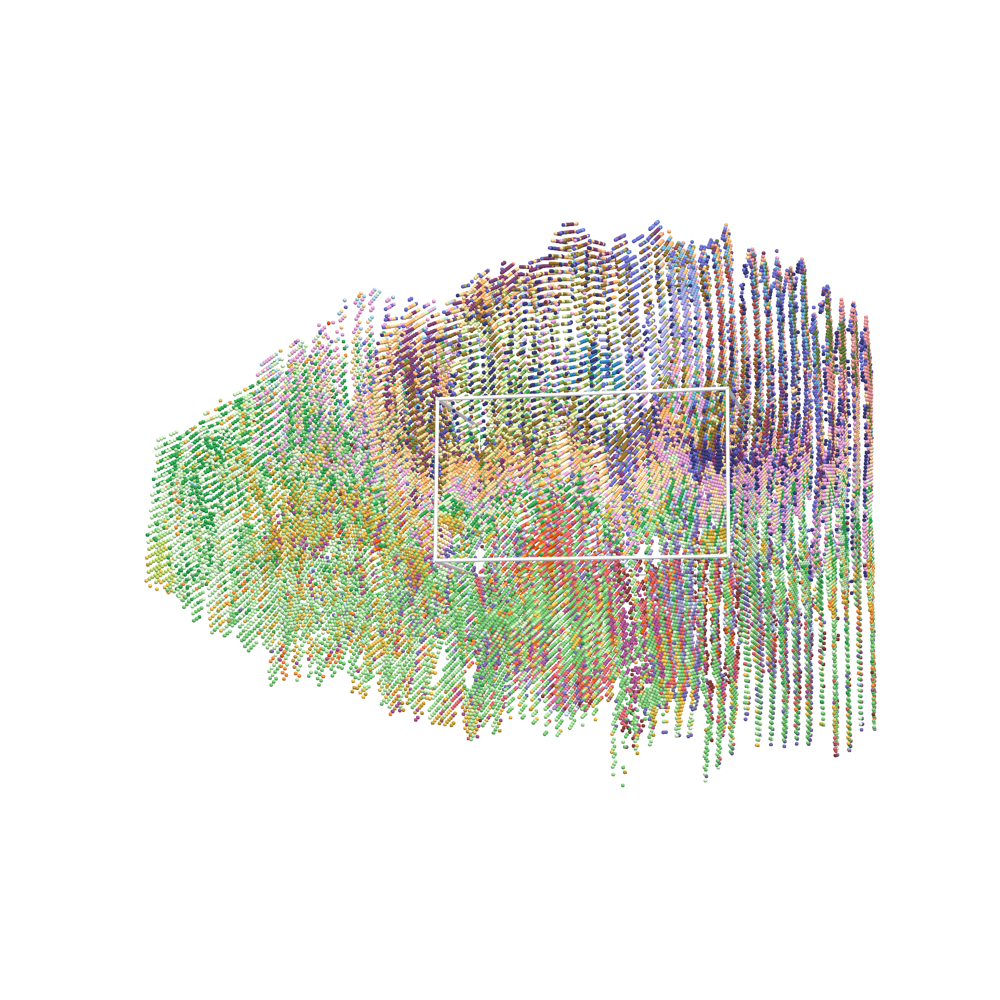

In [48]:
import os
pv.global_theme.transparent_background = True
input_image_path = f"PASTE_human_embryo_view_2_with_box_new.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=st.tdr.collect_models([box, paste_aligned_pc]), 
    key="celltype", 
    model_style=["wireframe", "points"], 
    model_size=[8, 8],
    opacity=1,
    show_legend=False,
    show_axes=False,
    jupyter="static",
    cpo=cpo1,
    ambient=0.3,
    window_size=(2048, 2048),
    filename=os.path.join(figure_folder, input_image_path)
)

### Extract tissues in the box

In [31]:
labels_list

Index(['AM', 'AM.EXE.Meso', 'AM.Ecto', 'Axial.Meso', 'Connecting Stalk',
       'Definitive.Endo', 'Definitive.HSPC', 'EXE.Meso.Prog', 'Ecto', 'Epi',
       'Ery-1', 'Ery-2', 'Fibroblast', 'Gast/PS', 'HEC', 'Inter.Meso',
       'LP.Meso', 'MEP', 'Muscle fiber', 'Nascent.EXE.Meso', 'Noto',
       'Para.Meso', 'Primitive.HPSC', 'Primitive.Mac', 'Primitive.Mega-1',
       'Primitive.Mega-2', 'Visceral.Endo', 'YS.EXE.Meso-1', 'YS.EXE.Meso-2',
       'YS.Endo-1', 'YS.Endo-2', 'YS.Endo-3', 'YS.Endo-4', 'YS.Mesothelium'],
      dtype='object')

In [45]:
anno_key = "subcluster"
spatial_key = "PASTE_aligned_spatial_3D"
# tissue_name = ['Ery-1','Ery-2', 'YS.Endo-3']
tissue_name = ['Ery-1', 'Ery-2', 'LP.Meso']
select_idx = (adata.obs_names.isin(paste_aligned_pc_clip['obs_index'])) & (adata.obs[anno_key].isin(tissue_name))
bound_idx = ((adata.obsm[spatial_key] < bound_max) & ((adata.obsm[spatial_key] > bound_min))).sum(1) == 3

tissue_pc, _ = st.tdr.construct_pc(
    adata=adata[select_idx],
    spatial_key=spatial_key,
    groupby=anno_key,
    key_added="celltype",
    colormap=palette,
)
tissue_remain_pc, _ = st.tdr.construct_pc(
    adata=adata[bound_idx & (~select_idx)],
    spatial_key=spatial_key,
    groupby=anno_key,
    key_added="celltype",
    colormap=palette,
)
tissue_cpo, _ = st.pl.three_d_plot(
    model=st.tdr.collect_models([box, tissue_pc, tissue_remain_pc]), 
    key="celltype",
    opacity=[1, 1, 0.1],
    model_style=["wireframe", "points", "points"], 
    model_size=[8, 8, 8],
    off_screen=False,
    window_size=(1024, 1024),
    jupyter=False,
    cpo="xy",
    show_axes=True,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



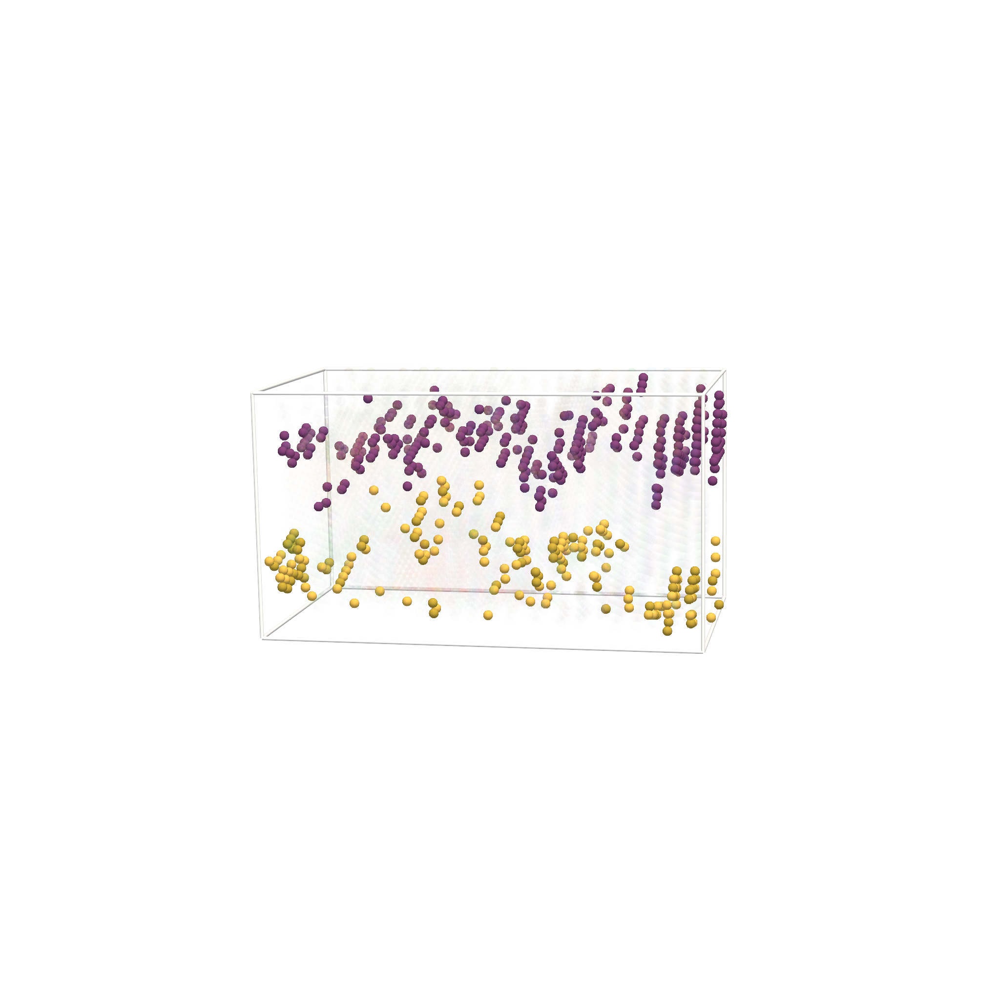

In [46]:
import os
pv.global_theme.transparent_background = True
input_image_path = f"PASTE_human_embryo_view_2_box1_new.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=st.tdr.collect_models([box, tissue_pc, tissue_remain_pc]), 
    key="celltype",
    opacity=[1, 1, 0.1],
    model_style=["wireframe", "points", "points"], 
    model_size=[8, 20, 20],
    show_legend=False,
    show_axes=False,
    jupyter="static",
    cpo=tissue_cpo,
    ambient=0.3,
    window_size=(2048, 2048),
    filename=os.path.join(figure_folder, input_image_path)
)

# Spateo

In [49]:
spateo_aligned_pc_clip,_  = st.tdr.construct_pc(adata=adata[adata.obs_names.isin(paste_aligned_pc_clip['obs_index'])],spatial_key='aligned_spatial_3D',groupby='subcluster',key_added='celltype', colormap=palette)

In [50]:
bound_max = paste_aligned_pc_clip.points.max(0) - paste_aligned_pc_clip.points.mean(0) + spateo_aligned_pc_clip.points.mean(0)
bound_min = paste_aligned_pc_clip.points.min(0) - paste_aligned_pc_clip.points.mean(0) + spateo_aligned_pc_clip.points.mean(0)
# Define the box corners based on the bounds
corners = np.array([[bound_min[0], bound_min[1], bound_min[2]],
                    [bound_max[0], bound_min[1], bound_min[2]],
                    [bound_max[0], bound_max[1], bound_min[2]],
                    [bound_min[0], bound_max[1], bound_min[2]],
                    [bound_min[0], bound_min[1], bound_max[2]],
                    [bound_max[0], bound_min[1], bound_max[2]],
                    [bound_max[0], bound_max[1], bound_max[2]],
                    [bound_min[0], bound_max[1], bound_max[2]]])

# Create a PolyData object for the corners
box = pv.PolyData(corners)

# Define the edges of the box
edges = np.array([[0, 1], [1, 2], [2, 3], [3, 0],  # Bottom face
                  [4, 5], [5, 6], [6, 7], [7, 4],  # Top face
                  [0, 4], [1, 5], [2, 6], [3, 7]]) # Vertical edges

# Add the edges to the PolyData object
box.lines = np.hstack((np.ones((12, 1)) * 2, edges)).astype(np.int32)

import matplotlib as mpl
labels = ["embryo_shell"]*box.n_cells
box.cell_data["celltype"] = labels
c = [1,1,1]
a = 1
labels_rgba = [mpl.colors.to_rgba(c, alpha=a)] * box.n_cells
labels_rgba = np.array(labels_rgba).astype(np.float32)
box.cell_data["celltype_rgba"] = labels_rgba

In [51]:
cpo1, _ = st.pl.three_d_plot(
    model=st.tdr.collect_models([box, aligned_pc]), 
    key="celltype", 
    model_style=["wireframe", "points"], 
    model_size=[2, 4],
    colormap=None,
    show_legend=True,
    show_axes=True,
    jupyter=False,
    cpo="xz",
    window_size=(800, 800),
    ambient=0.2,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



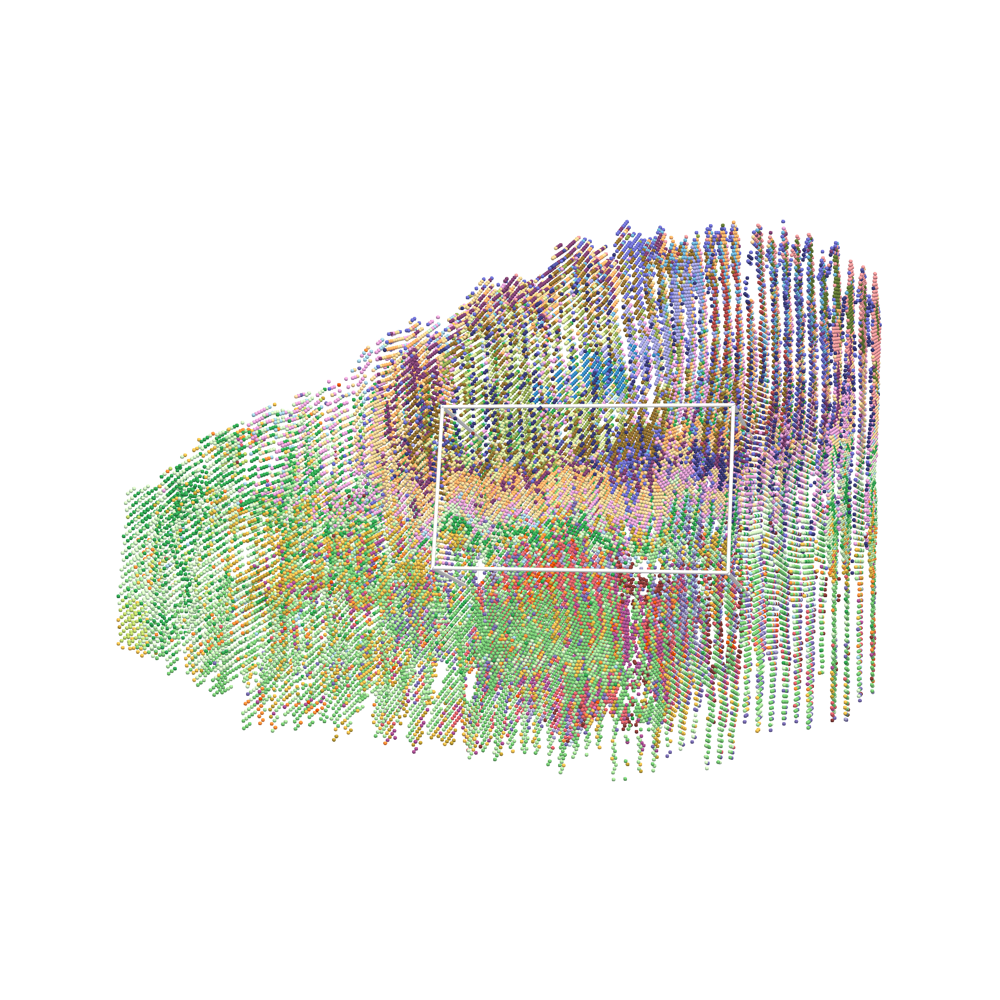

In [52]:
import os
pv.global_theme.transparent_background = True
input_image_path = f"Spateo_human_embryo_view_2_with_box_new.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=st.tdr.collect_models([box, aligned_pc]), 
    key="celltype", 
    model_style=["wireframe", "points"], 
    model_size=[8, 8],
    opacity=1,
    show_legend=False,
    show_axes=False,
    jupyter="static",
    cpo=cpo1,
    ambient=0.3,
    window_size=(2048, 2048),
    filename=os.path.join(figure_folder, input_image_path)
)

In [54]:
anno_key = "subcluster"
spatial_key = "aligned_spatial_3D"
# tissue_name = ['Ery-1','Ery-2', 'YS.Endo-3']
tissue_name = ['Ery-1', 'Ery-2', 'LP.Meso']
bound_idx = ((adata.obsm[spatial_key] < bound_max) & ((adata.obsm[spatial_key] > bound_min))).sum(1) == 3
select_idx = (adata.obs_names.isin(paste_aligned_pc_clip['obs_index'])) & (adata.obs[anno_key].isin(tissue_name)) & bound_idx


tissue_pc, _ = st.tdr.construct_pc(
    adata=adata[select_idx],
    spatial_key=spatial_key,
    groupby=anno_key,
    key_added="celltype",
    colormap=palette,
)
tissue_remain_pc, _ = st.tdr.construct_pc(
    adata=adata[bound_idx & (~select_idx)],
    spatial_key=spatial_key,
    groupby=anno_key,
    key_added="celltype",
    colormap=palette,
)
tissue_cpo, _ = st.pl.three_d_plot(
    model=st.tdr.collect_models([box, tissue_pc, tissue_remain_pc]), 
    key="celltype",
    opacity=[1, 1, 0.1],
    model_style=["wireframe", "points", "points"], 
    model_size=[8, 8, 8],
    off_screen=False,
    window_size=(1024, 1024),
    jupyter=False,
    cpo="xy",
    show_axes=True,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



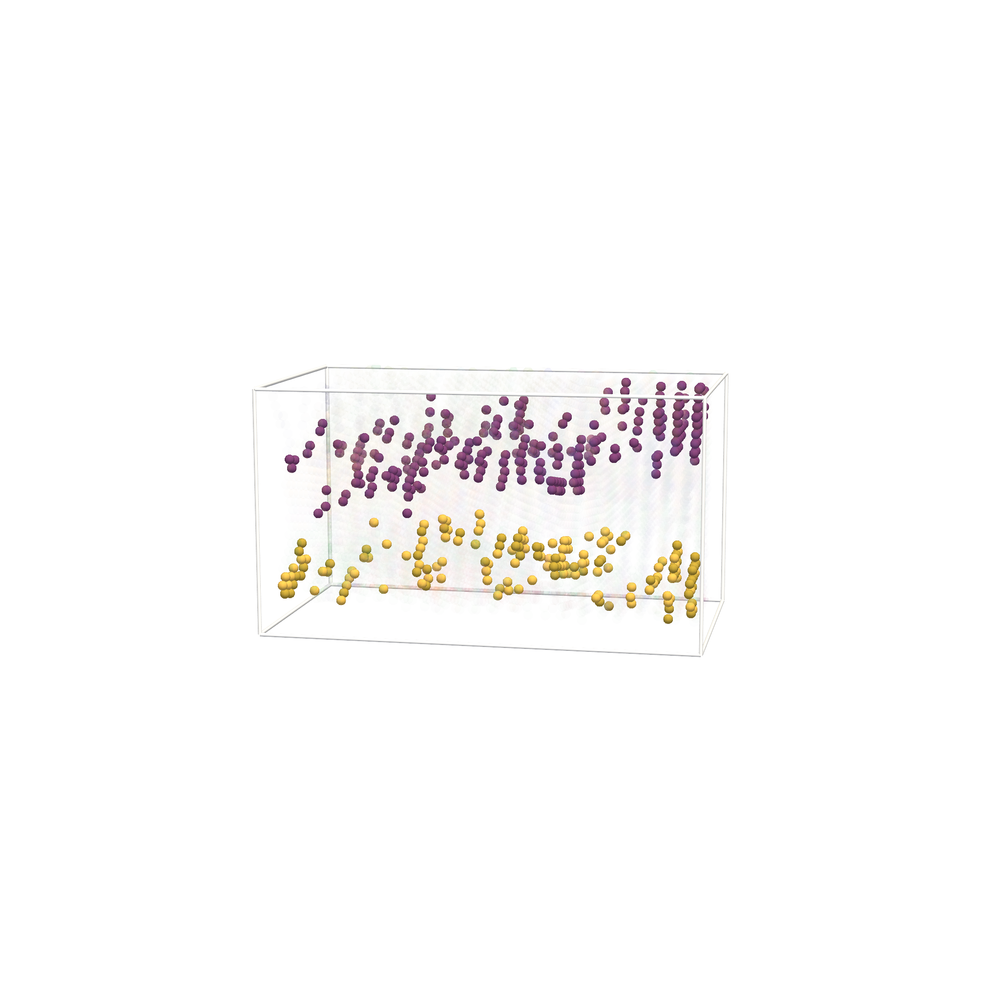

In [55]:
import os
pv.global_theme.transparent_background = True
input_image_path = f"Spateo_human_embryo_view_2_box1_new.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=st.tdr.collect_models([box, tissue_pc, tissue_remain_pc]), 
    key="celltype",
    opacity=[1, 1, 0.1],
    model_style=["wireframe", "points", "points"], 
    model_size=[8, 20, 20],
    show_legend=False,
    show_axes=False,
    jupyter="static",
    cpo=tissue_cpo,
    ambient=0.3,
    window_size=(2048, 2048),
    filename=os.path.join(figure_folder, input_image_path)
)

## Box2 For PASTE

In [87]:
## clip paste
paste_aligned_pc_clip2 = paste_aligned_pc.copy()

In [93]:
paste_aligned_pc_clip2 = st.tdr.interactive_rectangle_clip(model=paste_aligned_pc_clip2, key='celltype', invert=True)[0]

In [94]:
bound_max = paste_aligned_pc_clip2.points.max(0)
bound_min = paste_aligned_pc_clip2.points.min(0)
# Define the box corners based on the bounds
corners = np.array([[bound_min[0], bound_min[1], bound_min[2]],
                    [bound_max[0], bound_min[1], bound_min[2]],
                    [bound_max[0], bound_max[1], bound_min[2]],
                    [bound_min[0], bound_max[1], bound_min[2]],
                    [bound_min[0], bound_min[1], bound_max[2]],
                    [bound_max[0], bound_min[1], bound_max[2]],
                    [bound_max[0], bound_max[1], bound_max[2]],
                    [bound_min[0], bound_max[1], bound_max[2]]])

# Create a PolyData object for the corners
box2 = pv.PolyData(corners)

# Define the edges of the box
edges = np.array([[0, 1], [1, 2], [2, 3], [3, 0],  # Bottom face
                  [4, 5], [5, 6], [6, 7], [7, 4],  # Top face
                  [0, 4], [1, 5], [2, 6], [3, 7]]) # Vertical edges

# Add the edges to the PolyData object
box2.lines = np.hstack((np.ones((12, 1)) * 2, edges)).astype(np.int32)

import matplotlib as mpl
labels = ["embryo_shell"]*box2.n_cells
box2.cell_data["celltype"] = labels
c = [1,1,1]
a = 1
labels_rgba = [mpl.colors.to_rgba(c, alpha=a)] * box2.n_cells
labels_rgba = np.array(labels_rgba).astype(np.float32)
box2.cell_data["celltype_rgba"] = labels_rgba

In [96]:
cpo1, _ = st.pl.three_d_plot(
    model=st.tdr.collect_models([box, box2, paste_aligned_pc]), 
    key="celltype", 
    model_style=["wireframe", "wireframe", "points"], 
    model_size=[2,2, 4],
    colormap=None,
    show_legend=True,
    show_axes=True,
    jupyter=False,
    cpo="xz",
    window_size=(800, 800),
    ambient=0.2,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



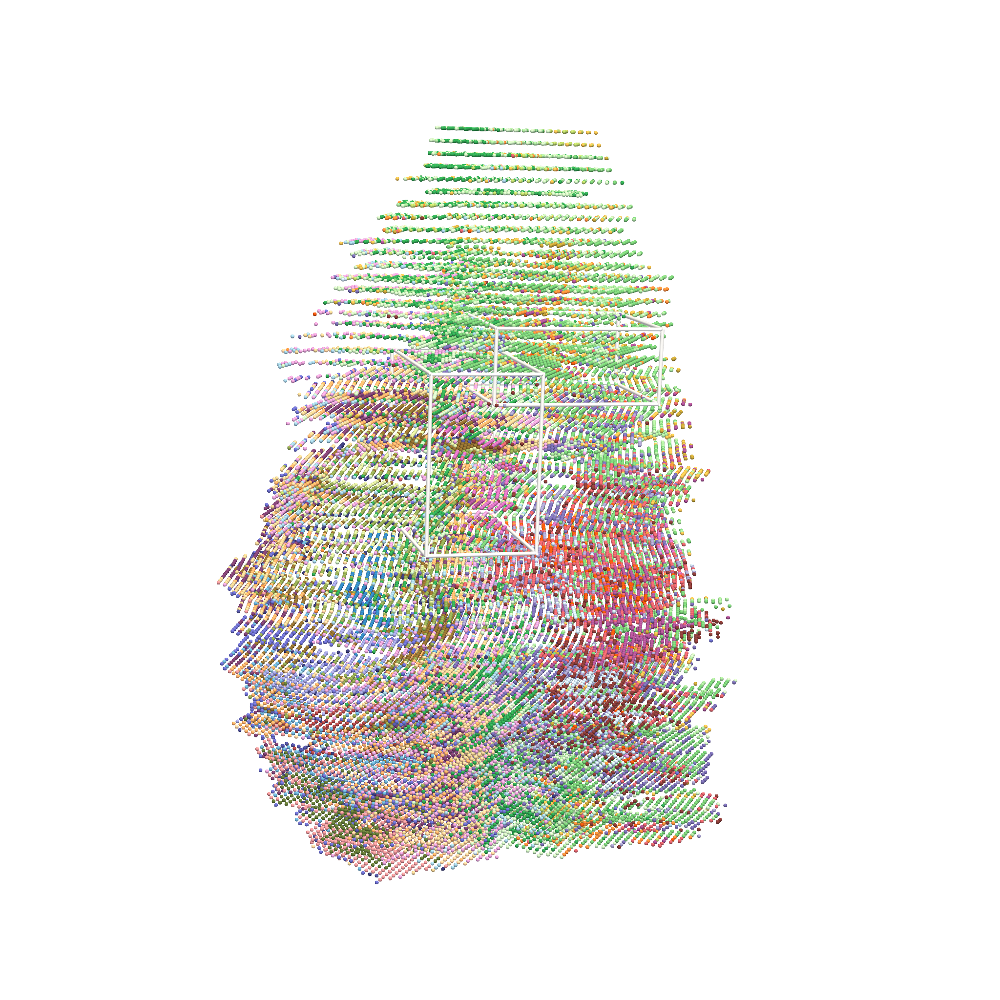

In [97]:
import os
pv.global_theme.transparent_background = True
input_image_path = f"PASTE_human_embryo_view_1_with_2box_new.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=st.tdr.collect_models([box, box2, paste_aligned_pc]), 
    key="celltype", 
    model_style=["wireframe", "wireframe", "points"], 
    model_size=[8, 8, 8],
    opacity=1,
    show_legend=False,
    show_axes=False,
    jupyter="static",
    cpo=cpo1,
    ambient=0.3,
    window_size=(2048, 2048),
    filename=os.path.join(figure_folder, input_image_path)
)

In [102]:
anno_key = "subcluster"
spatial_key = "PASTE_aligned_spatial_3D"
# tissue_name = ['Ery-1','Ery-2', 'YS.Endo-3']
tissue_name = ['Muscle fiber']
select_idx = (adata.obs_names.isin(paste_aligned_pc_clip2['obs_index'])) & (adata.obs[anno_key].isin(tissue_name))
bound_idx = ((adata.obsm[spatial_key] < bound_max) & ((adata.obsm[spatial_key] > bound_min))).sum(1) == 3

tissue_pc, _ = st.tdr.construct_pc(
    adata=adata[select_idx],
    spatial_key=spatial_key,
    groupby=anno_key,
    key_added="celltype",
    colormap=palette,
)
tissue_remain_pc, _ = st.tdr.construct_pc(
    adata=adata[bound_idx & (~select_idx)],
    spatial_key=spatial_key,
    groupby=anno_key,
    key_added="celltype",
    colormap=palette,
)
tissue_cpo, _ = st.pl.three_d_plot(
    model=st.tdr.collect_models([box2, tissue_pc, tissue_remain_pc]), 
    key="celltype",
    opacity=[1, 1, 0.1],
    model_style=["wireframe", "points", "points"], 
    model_size=[8, 8, 8],
    off_screen=False,
    window_size=(1024, 1024),
    jupyter=False,
    cpo="xy",
    show_axes=True,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



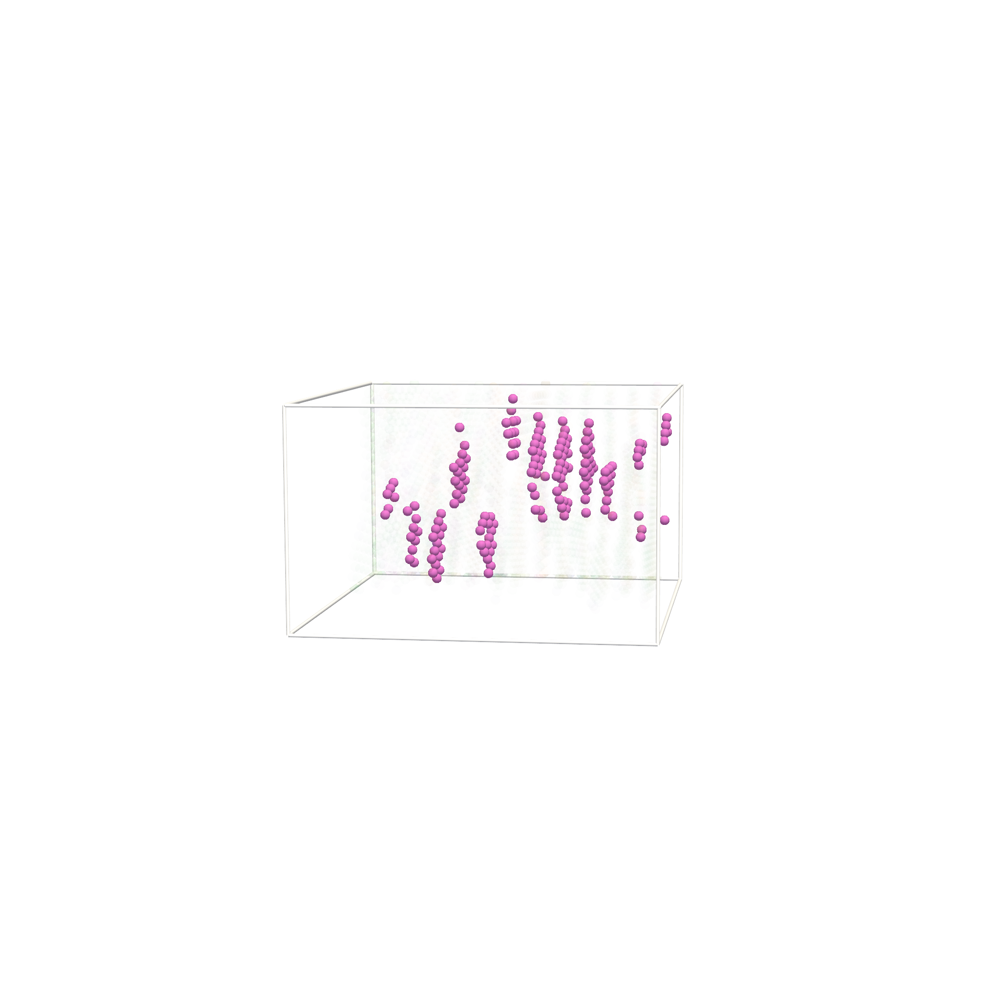

In [103]:
import os
pv.global_theme.transparent_background = True
input_image_path = f"PASTE_human_embryo_view_1_box2_new.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=st.tdr.collect_models([box2, tissue_pc, tissue_remain_pc]), 
    key="celltype",
    opacity=[1, 1, 0.1],
    model_style=["wireframe", "points", "points"], 
    model_size=[8, 20, 20],
    show_legend=False,
    show_axes=False,
    jupyter="static",
    cpo=tissue_cpo,
    ambient=0.3,
    window_size=(2048, 2048),
    filename=os.path.join(figure_folder, input_image_path)
)